# TensorFlow and TensorBoard with Evaluation



## Purpose

The purpose of this lab is twofold.  

1.   to review using `TensorFlow` for modeling and evaluation with neural networks
2.   to learn about [`TensorBoard`](https://www.tensorflow.org/tensorboard)

`TensorBoard` is `TensorFlow`'s visualization toolkit, so it is a dashboard that provides visualization and tooling that is needed for machine learning experimentation. 

We'll be using the canonical [Titanic Data Set](https://www.kaggle.com/competitions/titanic/overview).

## The Titanic

### The Titanic Data Set



RMS Titanic was a British passenger liner built by Harland and Wolf and operated by the White Star Line. It sank in the North Atlantic Ocean in the early morning hours of 15 April 1912, after striking an iceberg during her maiden voyage from Southampton, England to New York City, USA.

Of the estimated 2,224 passengers and crew aboard, more than 1,500 died, making the sinking one of modern history's deadliest peacetime commercial marine disasters. 

Though there were about 2,224 passengers and crew members, we are given data of about 1,300 passengers. Out of these 1,300 passengers details, about 900 data is used for training purpose and remaining 400 is used for test purpose. The test data has had the survived column removed and we'll use neural networks to predict whether the passengers in the test data survived or not. Both training and test data are not perfectly clean as we'll see.

Below is a picture of the Titanic Museum in Belfast, Northern Ireland.

In [1]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://upload.wikimedia.org/wikipedia/commons/c/c0/Titanic_Belfast_HDR.jpg", width=400, height=400)

### Data Dictionary

*   *Survival* : 0 = No, 1 = Yes
*   *Pclass* : A proxy for socio-economic status (SES)
  *   1st = Upper
  *   2nd = Middle
  *   3rd = Lower
*   *sibsp* : The number of siblings / spouses aboard the Titanic
  *   Sibling = brother, sister, stepbrother, stepsister
  *   Spouse = husband, wife (mistresses and fiancés were ignored)
*   *parch* : The # of parents / children aboard the Titanic
  *   Parent = mother, father
  *   Child = daughter, son, stepdaughter, stepson
  *   Some children travelled only with a nanny, therefore *parch*=0 for them.
*   *Ticket* : Ticket number
*   *Fare* : Passenger fare (British pounds)
*   *Cabin* : Cabin number embarked
*   *Embarked* : Port of Embarkation
  *   C = Cherbourg (now Cherbourg-en-Cotentin), France
  *   Q = Queenstown (now Cobh), Ireland
  *   S = Southampton, England
*   *Name*, *Sex*, *Age* (years) are all self-explanatory

## Libraries and the Data



### Importing libraries

In [2]:
# Load the germane libraries

import pandas as pd
import numpy as np
import seaborn as sns 
from pandas._libs.tslibs import timestamps
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import StandardScaler

import tensorflow as tf
import keras 
from keras import models
from keras.layers import Dense
from keras.models import Sequential
from keras.losses import binary_crossentropy
from keras.wrappers.scikit_learn import KerasClassifier

# Load the TensorBoard notebook extension and related libraries
%load_ext tensorboard
import datetime

### Loading the data

In [3]:
# Load the data

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

# We need to do this for when we mamke our predictions from the test data at the end
ids = test[['PassengerId']]

## EDA and Preprocessing

### Exploratory Data Analysis

It is your choice how much or how little EDA that you perform. But you should do enough EDA that you feel comfortable with the data and what you'll need to do to make it so that you can run a neural network on it.

It is prudent to investigate the attributes of the data frames, create visualizations, and perform data analysis.

### Preprocessing

In [4]:
# Print the first rows of the train data
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [5]:
# Look at the information regarding the train data
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [6]:
# Print the first rows of the test data
test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [7]:
# Look at the information regarding the test data
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


In [9]:
# Print the number of rows and columns in each data set
print(train.shape)
print(test.shape)

(891, 12)
(418, 11)


We notice that the total number of columns in the training data (12) is one more tha test data (11). The former has the "survived" column whereas the latter does not since that is what we want the neural network to be able to predict.

#### Visualizations

There are a number of plots that we could do. Here are a few with brief comments about each.

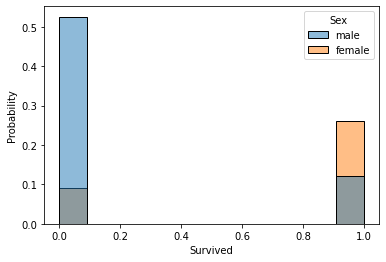

In [11]:
# Histogram with survival and sex
sns.histplot(x='Survived', hue = 'Sex', stat = 'probability', data = train)
plt.show()

Since '0' represents not surviving and '1' represents surviving, then we can see that females were much more likely to survice than males.

And now let's look at survival by class (first, second, or third).

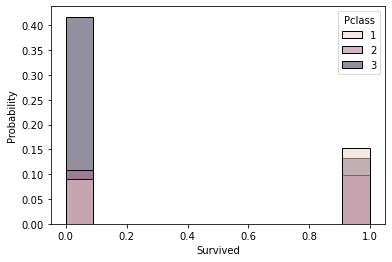

In [17]:
# Histogram with survival and class
sns.histplot(x="Survived", hue = 'Pclass', stat = 'probability',  data = train)
plt.show()

While the differences between second and third class doesn't seem very diffrent, those in third class seem more likely to die.

We can see this more clealry in the next graph.

C:\Users\SRIRASUBRAMANIAN\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\SRIRASUBRAMANIAN\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


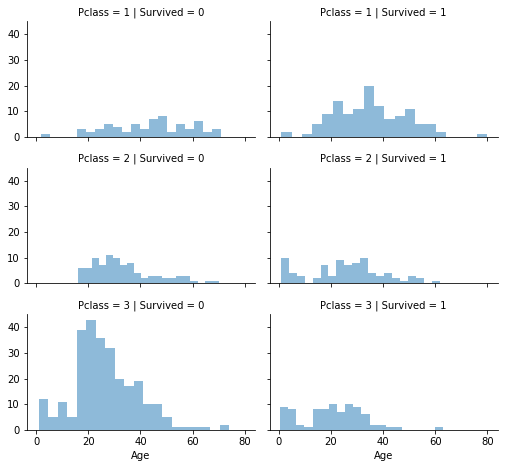

In [18]:
# FaceGrid of Class and Survived with Age
grid = sns.FacetGrid(train, col='Survived', row='Pclass', height=2.2, aspect=1.6)
grid.map(plt.hist, 'Age', alpha=.5, bins=20)
grid.add_legend()
plt.show()

What conclusions can you draw from the above grid?

Finally, let's look at a heatmap to see which columns are correlated.

Class 3 cleary seems to have lowest rate of survival

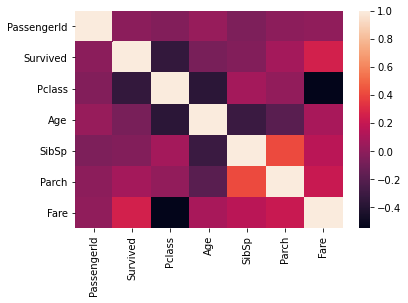

In [20]:
# Heatmap
corr_train = train.corr()
sns.heatmap(corr_train)
plt.show()

What columns are correlated? Does this surprise you? Which columns are not correlated? Does this surprise you?

#### Data Analysis

Again there are a myriad of data analysis that we can do, but let's show some examples of what we may want to look it. Again, do as many as you think are appropriate and you should interpret the results explicitly.

In [21]:
# Surival rate by sex 
((train.groupby(['Sex','Survived']).Survived.count() * 100) / train.groupby('Sex').Survived.count())

Sex     Survived
female  0           25.796178
        1           74.203822
male    0           81.109185
        1           18.890815
Name: Survived, dtype: float64

Females had about 74% chance of survival where as men had only about a 19%.

Now let's do the same, but with class as well.

In [22]:
# Survival rate by class
(train.groupby(['Pclass','Survived', 'Sex']).Survived.count() * 100) / train.groupby('Pclass').Survived.count()

Pclass  Survived  Sex   
1       0         female     1.388889
                  male      35.648148
        1         female    42.129630
                  male      20.833333
2       0         female     3.260870
                  male      49.456522
        1         female    38.043478
                  male       9.239130
3       0         female    14.663951
                  male      61.099796
        1         female    14.663951
                  male       9.572301
Name: Survived, dtype: float64

We can see that as the class increases, the likelihood of survivial increases; and again females are more likely to survive then males.

### Preprocessing

#### Missing Data

In order for our neural network to run properly, we need to see if we have any missing data... and if so, we need to deal with it.

In [27]:
# Check for nulls in the train set
train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [28]:
# Check for nulls in the test set
test.isna().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

So we have a decent amount missing data for *Age* in both the train and tests sets. There are also a couple from *Embarked* from the train set and one in *Fare* from the test set.

In [29]:
# Performing preprocessing on the train and test data will be more effecient if we combine the two date sets.
# run this cell with no changes
combined = pd.concat([train, test], axis=0, sort=False)

There are different ways to deal with missing data, which we'll turn to next.

#### Combining numeric features and converting categorical feasture

One possibility for dealing with the missing data is to
*    fill the nan values for *Age* and *Fare* with the median of each respective column
*   the embarked column with the most frequent value, which is *S* for Southampton

Once we clean up *Age* we can create a variable from it called *Child*, that allows us to look at the data as adults or children.

In [30]:
# run this cell with no changes
#Age column
combined['Age'].fillna(combined['Age'].median(),inplace=True) # Age

# Embarked column
combined['Embarked'].fillna(combined['Embarked'].value_counts().index[0], inplace=True) # Embarked
combined['Fare'].fillna(combined['Fare'].median(),inplace=True)

# Class column
d = {1:'1st',2:'2nd',3:'3rd'} #Pclass
combined['Pclass'] = combined['Pclass'].map(d) #Pclass

# Making Age into adult (1) and child (0)
combined['Child'] = combined['Age'].apply(lambda age: 1 if age>=18 else 0) 

In [32]:
# view the current status of the combined dataframe
combined.isna().sum()

PassengerId       0
Survived        418
Pclass            0
Name              0
Sex               0
Age               0
SibSp             0
Parch             0
Ticket            0
Fare              0
Cabin          1014
Embarked          0
Child             0
dtype: int64

We have two categorical features, viz. *Sex* and *Embarked*. We need to make these numeric.

For *Sex*, let
*   Male = 0
*   Female = 1

For *Embarked*, let
*   Q = 0 (Queenstown)
*   S = 1 (Southampton)
*   C = 2 (Cherbourg)

If you did the heatmap above, you can see that there are some correlations between variables. You can choose modify the data set if you like. For the purposes of this exercise, we won't.

While the names of the individual passengers is not germane to our neural network model, the titles of the passengers may be worthwhile.

In [33]:
# run this cell with no changes
# Break up the string that has the title and names
combined['Title'] = combined['Name'].str.split('.').str.get(0)  # output : 'Futrelle, Mrs'
combined['Title'] = combined['Title'].str.split(',').str.get(1) # output : 'Mrs '
combined['Title'] = combined['Title'].str.strip()               # output : 'Mrs'
combined.groupby('Title').count()

# Replace the French titles with Enlgish
french_titles = ['Don', 'Dona', 'Mme', 'Ms', 'Mra','Mlle']
english_titles = ['Mr', 'Mrs','Mrs','Mrs','Mrs','Miss']
for i in range(len(french_titles)):
    for j in range(len(english_titles)):
        if i == j:
            combined['Title'] = combined['Title'].str.replace(french_titles[i],english_titles[j])

# Separate the titles into "major" and "others", the latter would be, e.g., Reverend
major_titles = ['Mr','Mrs','Miss','Master']
combined['Title'] = combined['Title'].apply(lambda title: title if title in major_titles else 'Others')

Finally, we ned to drop the feature columns that we do not need for our model (`PassengerID`, `Name`, `Ticket`, and `Cabin`).

In [34]:
#Dropping the Irrelevant Columns
combined.drop(['PassengerId','Name','Ticket','Cabin'], axis=1, inplace=True)

# Getting Dummy Variables and Dropping the Original Categorical Variables
categorical_vars = combined[['Pclass','Sex','Embarked','Title','Child']] # Get Dummies of Categorical Variables 
dummies = pd.get_dummies(categorical_vars,drop_first=True)
combined = combined.drop(['Pclass','Sex','Embarked','Title','Child'],axis=1)
combined = pd.concat([combined, dummies],axis=1)

#### Resplitting the data and scaling the data.

We need to split our data back into the training and test sets now that we have done all but one aspect of the preprocessing.

In [47]:
# Separate the data back into train and test sets
test = combined[combined['Survived'].isna() == True].drop("Survived", axis = 1)
train = combined[combined["Survived"].isna() == False]

We need to get the training data into the predictors and the predicted variables, and scale the data.

In [48]:
# Training
X_train = train.drop(['Survived'],axis=1)
y_train = train['Survived']

# Scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
test = sc.fit_transform(test)

## Neural Network Model

### Building the model

#### Define the model as a pipeline

Let's use the data science pipeline for our neural network model.

In [59]:
# It will help to define our model in terms of a pipeline
def build_classifier(optimizer):
    classifier = Sequential()
    # use classifer.add() to add layers
    # 
    # ... 
    classifier.add(Dense(units = 14, activation='relu', input_dim = 14))
    classifier.add(Dense(units = 7, activation='relu', input_dim = 14))
    classifier.add(Dense(units = 1, activation='sigmoid'))
    classifier.compile(loss='binary_crossentropy',
                      metrics=['accuracy'])
    #
    # use classifer.compile() as your last line of the definition; use loss='binary_crossentropy',metrics=['accuracy']
    return classifier

# Note: Do not use regularization methods or GridSearch. Those will be for next time!

#### Fitting the optimal model and evaluating with `TensorBoard`

#### `TensorBoard`

`TensorBoard` is `TensorFlow`'s visualization toolkit. It is a dashboard that provides visualization and tooling that is needed for machine learning experimentation. The code immediately below will allow us to use TensorBoard.

N.B. When we loaded the libraries, we loaded the TensorBoard notebook extension. (It is the last line of code in the first code chunk.)

In [60]:
# Clear out any prior log data.
!rm -rf logs
# Be careful not to run this command if already have trained your model and you want to use TensorBoard.

# Sets up a timestamped log directory
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# Creates a file writer for the log directory.
file_writer = tf.summary.create_file_writer(log_dir)


# The callback function, which will be called in the fit()
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

#### Fitting the optimal model and evaluating with `TensorBoard`

In [61]:
# Using KerasClassifier

classifier = KerasClassifier(build_fn = build_classifier,
                             optimizer='Adam',
                             batch_size=10,
                             epochs=16)

# Fit the model with the tensorboard_callback
classifier.fit(X_train,
               y_train,
               verbose=1,
               callbacks=[tensorboard_callback])


# Warning: If verbose = 0 (silent) or 2 (one line per epoch), then on TensorBoard's Graphs tab there will be an error.
# The other tabs in TensorBoard will still be function, but if you want the graphs then verbose needs to be 1 (progress bar).

Epoch 1/16
90/90 [==============================] - 1s 7ms/step - loss: 0.6483 - accuracy: 0.6891
Epoch 2/16
90/90 [==============================] - 0s 3ms/step - loss: 0.5620 - accuracy: 0.7710: 0s - loss: 0.5969 - accuracy: 
Epoch 3/16
90/90 [==============================] - 0s 4ms/step - loss: 0.5038 - accuracy: 0.7980
Epoch 4/16
90/90 [==============================] - 0s 3ms/step - loss: 0.4674 - accuracy: 0.8137
Epoch 5/16
90/90 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.8137
Epoch 6/16
90/90 [==============================] - 0s 2ms/step - loss: 0.4320 - accuracy: 0.8148
Epoch 7/16
90/90 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8171
Epoch 8/16
90/90 [==============================] - 0s 2ms/step - loss: 0.4139 - accuracy: 0.8227
Epoch 9/16
90/90 [==============================] - 0s 2ms/step - loss: 0.4078 - accuracy: 0.8260
Epoch 10/16
90/90 [==============================] - 0s 4ms/step - loss: 0.4025 - accu

In [63]:
# Call TensorBoard
import os
print(f"https://{os.getenv('SATURN_JUPYTER_BASE_DOMAIN')}/proxy/8000/")
%tensorboard --logdir logs/fit --port 8000 --bind_all     

https://None/proxy/8000/


Reusing TensorBoard on port 8000 (pid 18500), started 0:07:24 ago. (Use '!kill 18500' to kill it.)

#### Results and Predictions

In [64]:
# results
preds = classifier.predict(test)
results = ids.assign(Survived=preds)
results['Survived'] = results['Survived'].apply(lambda row: 1 if row > 0.5 else 0)
results.to_csv('titanic_submission.csv',index=False)
results.head(20)

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,0
5,897,0
6,898,1
7,899,0
8,900,1
9,901,0


Continue to tweak your model until you are happy with the results based on model evaluation.

## Conclusion

Now that you have the `TensorBoard` to help you look at your model, you can better understand how to tweak your model.

We'll continue with this for the next lesson when we learn about model regularization.